In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from quantumnetworks import SingleModeSystem, plot_full_evolution, animate_evolution, DoubleModeSystem, MultiModeSystem, plot_evolution_phase_space,plot_full_evolution_phase_space
import numpy as np
from IPython.display import HTML, display

# Single Mode System

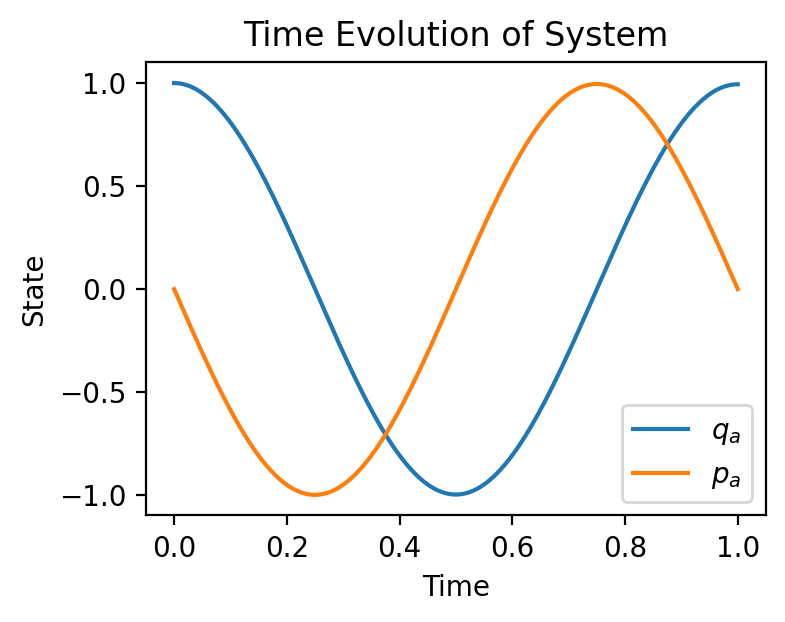

In [3]:
A_in = lambda t: 0
sys = SingleModeSystem(params={"omega_a": 2*np.pi*1, "kappa_a": 0, "kerr_a":0}, A_in = A_in)
x_0 = np.array([1,0])
ts = np.linspace(0, 1, 100001)
X = sys.forward_euler(x_0, ts)
fig, ax = plot_full_evolution(X, ts, labels=["$q_a$","$p_a$"])
ax.legend()

In [4]:
fig, ax = animate_evolution(X,ts, num_frames=100, animation_time=1)

# Double Mode System

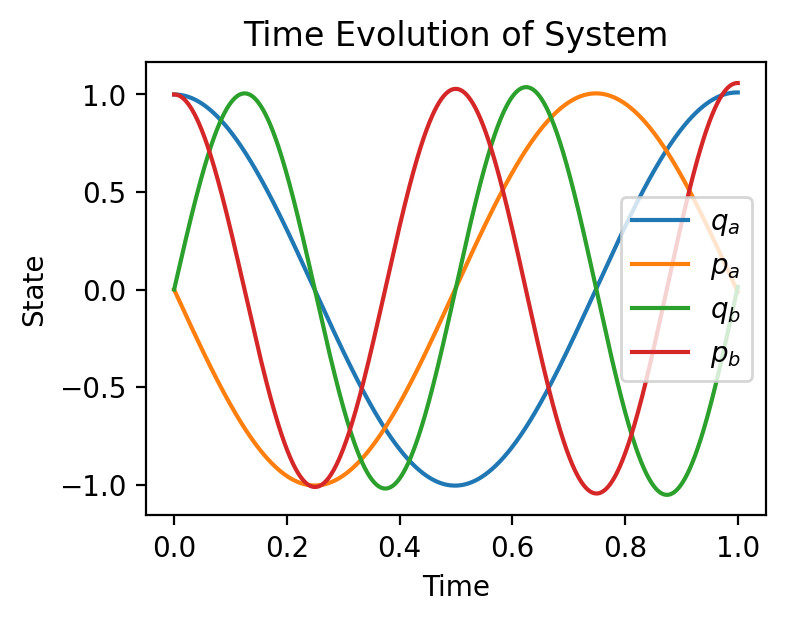

In [5]:
sys = DoubleModeSystem(params={})
x_0_2 = np.array([1,0,0,1])
ts2 = np.linspace(0, 1, 1001)
X2 = sys.forward_euler(x_0_2, ts2)
labels = ["$q_a$","$p_a$","$q_b$","$p_b$"]
fig, ax = plot_full_evolution(X2, ts2, labels=labels)
_ = ax.legend()

In [6]:
fig, axs = animate_evolution(X2,ts2, labels=labels, num_frames=100, animation_time=2)

# DEMO: Strongly Coupled Multi Mode System

In [20]:
omegas = [2*np.pi*1,2*np.pi*2,2*np.pi*1]
kappas = [2*np.pi*0.001,2*np.pi*0.005,2*np.pi*0.001]
gammas = [2*np.pi*0.002,2*np.pi*0.002,2*np.pi*0.002]
kerrs = [2*np.pi*0.001, 2*np.pi*0.001, 2*np.pi*0.001]
couplings = [[0,1,2*np.pi*0.8],[1,2,2*np.pi*0.8]]
sys = MultiModeSystem(params={"omegas":omegas, "kappas":kappas, "gammas":gammas, "kerrs":kerrs, "couplings":couplings})

x_0 = np.array([1,0, 0,0, 0,0])
ts = np.linspace(0, 1, 1001)
X = sys.forward_euler(x_0, ts)
labels = ["$q_a$","$p_a$", "$q_b$","$p_b$", "$q_c$","$p_c$"]

In [21]:
pos = {0: [0,0], 1:[.5,.5], 2:[1,1]}
sys.animate_networkx(X, ts, pos=pos, animation_time=1, num_frames=54)

(<Figure size 288x288 with 1 Axes>, <AxesSubplot:title={'center':'t = 0.98'}>)

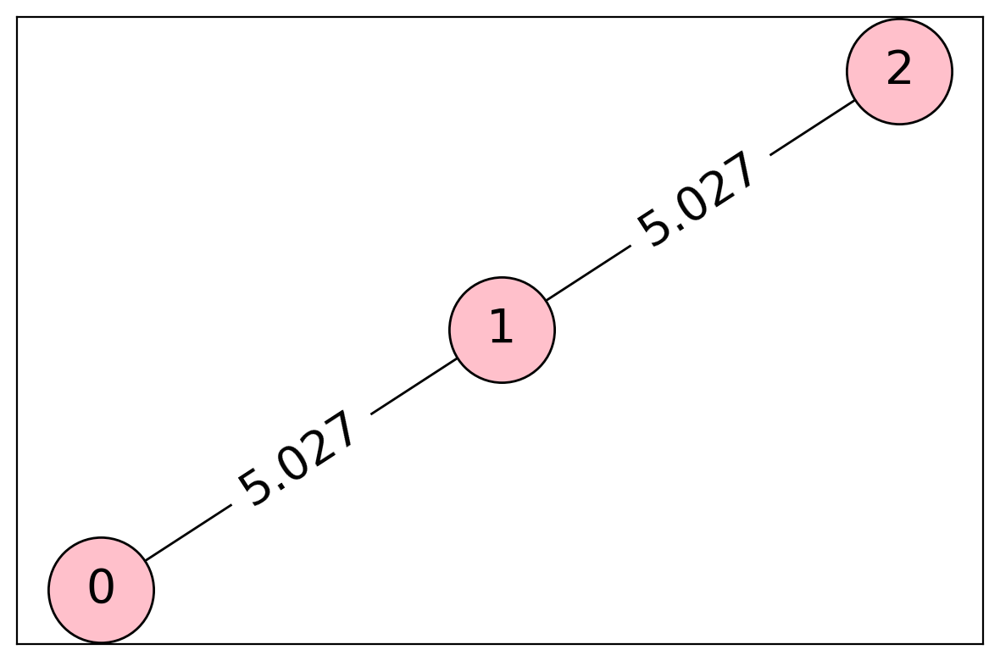

In [22]:
_, _, _ = sys.draw_network()

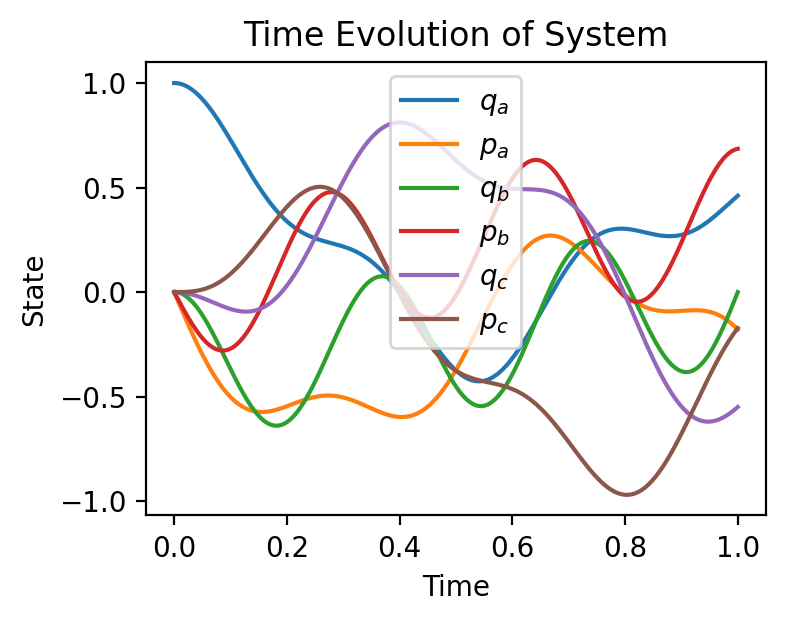

In [23]:
fig, ax = plot_full_evolution(X, ts, labels=labels)
ax.legend()

In [24]:
fig, axs = animate_evolution(X,ts, labels=labels, num_frames=100, animation_time=2)

# DEMO: Drive on Resonance (Single)

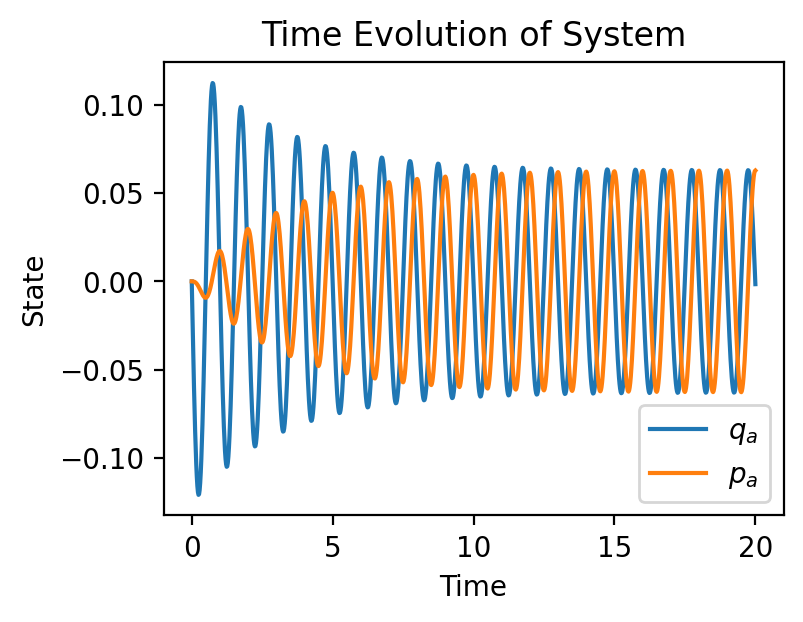

In [12]:
# ramp up on resonance
omega_a = 2*np.pi*1
delta = 2*np.pi*0.0
A_in = lambda t: np.exp(1j*(omega_a +delta)*t) #default A_in is used
sys = SingleModeSystem(params={"omega_a": omega_a, "kappa_a": 2*np.pi*0.1}, A_in = A_in)
x_0 = np.array([0,0])
ts = np.linspace(0, 20, 1001)
X = sys.trapezoidal(x_0, ts)
X[1,:] = X[1,:] 
fig, ax = plot_full_evolution(X, ts, labels=["$q_a$","$p_a$"])
ax.legend()

In [13]:
fig, axs = animate_evolution(X,ts, num_frames=1000, animation_time=2)

(<Figure size 800x800 with 1 Axes>,
 <AxesSubplot:title={'center':'Phase Space Evolution'}, xlabel='q', ylabel='p'>)

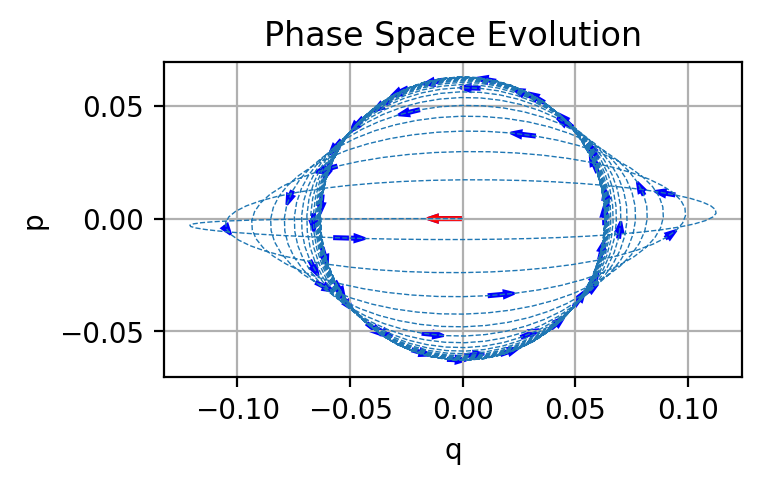

In [14]:
plot_evolution_phase_space(X)

# DEMO: Drive on Resonance (Multi)

In [15]:
omegas = [2*np.pi*1,2*np.pi*1,2*np.pi*1]
kappas = [2*np.pi*0.1,2*np.pi*0.2,2*np.pi*0.5]
gammas = np.zeros(3)
kerrs = np.zeros(3)

couplings = [[0,1,2*np.pi*0.002],[1,2,2*np.pi*0.002]]


periodic_drive_gen = lambda w, t: np.exp(1j*w*t) 

drives = {0:lambda t: periodic_drive_gen(omegas[0], t), 1:lambda t: periodic_drive_gen(omegas[1], t), 2:lambda t: periodic_drive_gen(omegas[2], t)}

sys = MultiModeSystem(params={"omegas":omegas, "kappas":kappas, "gammas":gammas, "kerrs":kerrs, "drives":drives, "couplings":couplings})

x_0 = np.array([0,0, 0,0, 0,0])
ts = np.linspace(0, 20, 1001)
X = sys.trapezoidal(x_0, ts)

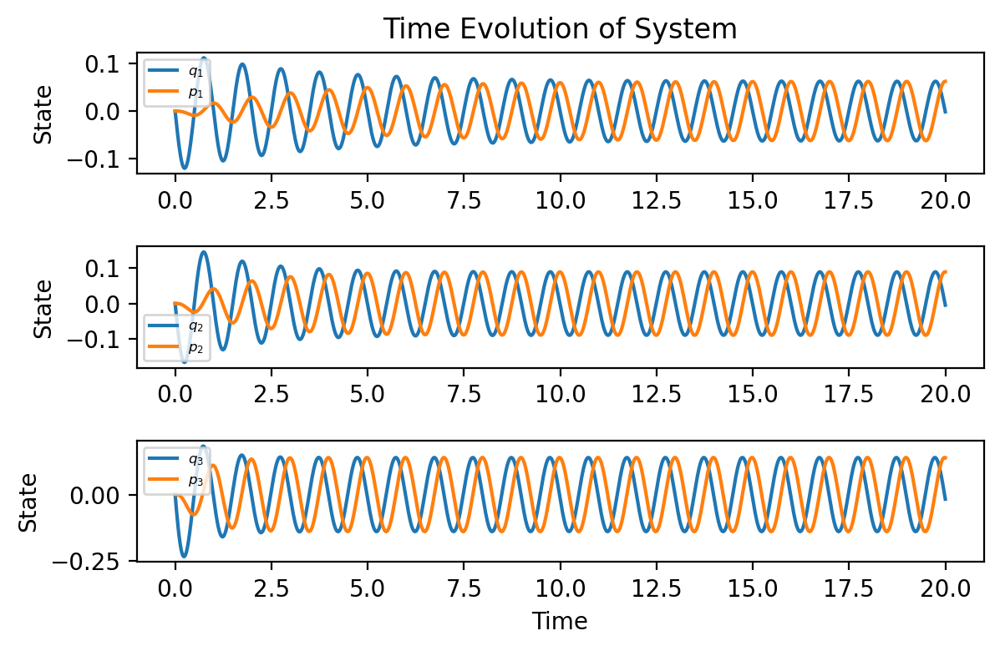

In [16]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3,1, dpi=200)

i = 0
ax = axs[i]
labels = [f"$q_{i+1}$",f"$p_{i+1}$"]
plot_full_evolution(X[:2], ts, fig=fig, ax=ax, labels=labels)
ax.legend(fontsize=6)
# ax.set_title(None)
ax.set_xlabel(None)

i = 1
ax = axs[i]
labels = [f"$q_{i+1}$",f"$p_{i+1}$"]
plot_full_evolution(X[2:4], ts, fig=fig, ax=ax,labels=labels)
ax.legend(fontsize=6)
ax.set_title(None)
ax.set_xlabel(None)

i = 2
ax = axs[i]
labels = [f"$q_{i+1}$",f"$p_{i+1}$"]
plot_full_evolution(X[4:6], ts, fig=fig, ax=ax,labels=labels)
ax.legend(fontsize=6)
ax.set_title(None)


fig.tight_layout()

(<Figure size 800x800 with 1 Axes>,
 <AxesSubplot:title={'center':'Phase Space Evolution'}, xlabel='q', ylabel='p'>)

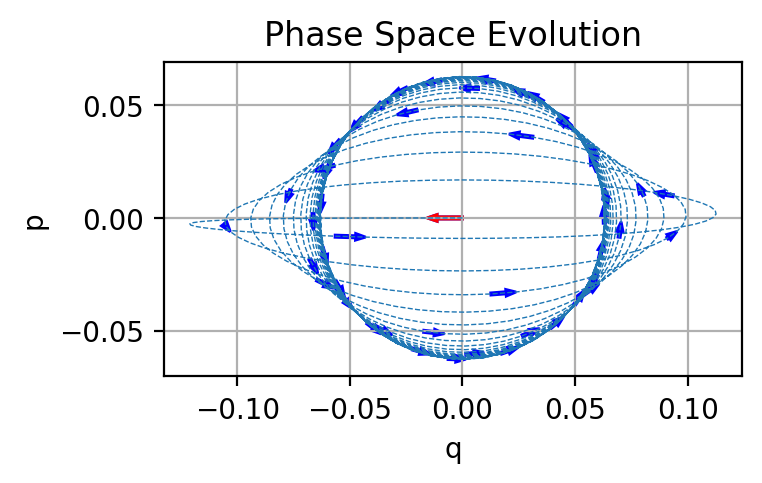

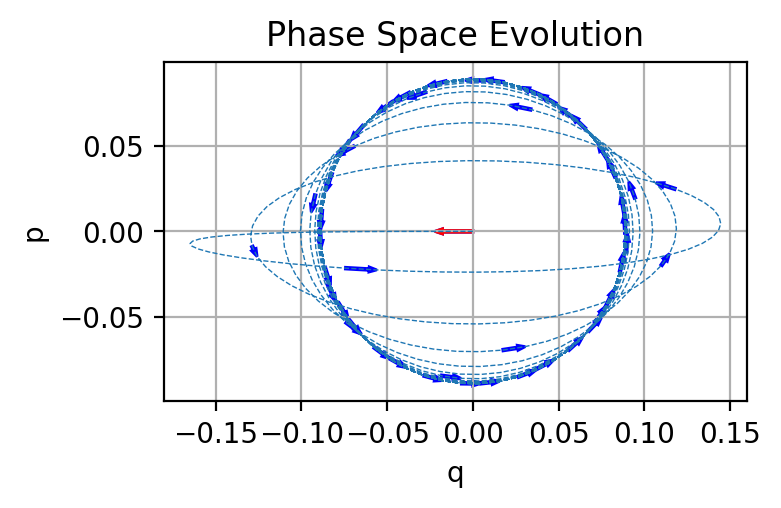

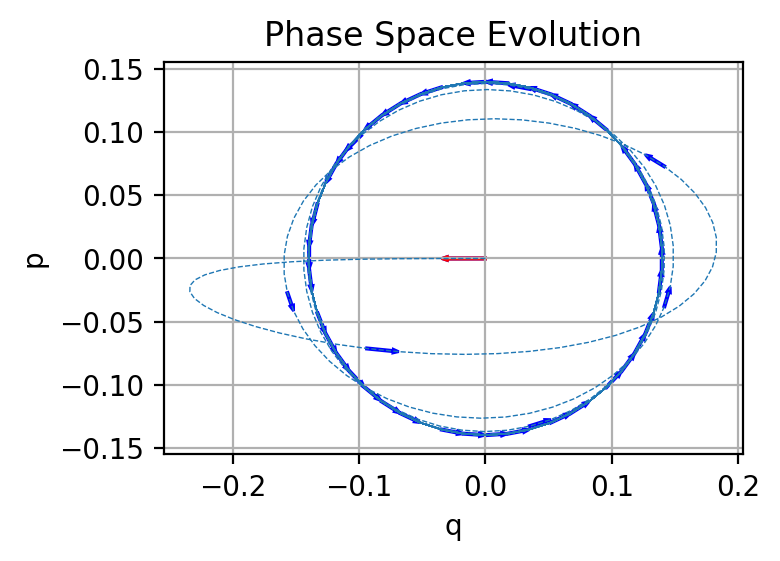

In [17]:
plot_evolution_phase_space(X[:2,::],  use_arrows=True)
plot_evolution_phase_space(X[2:4,::], use_arrows=True)
plot_evolution_phase_space(X[4:6,::], use_arrows=True)

(<Figure size 2400x800 with 3 Axes>,
 array([<AxesSubplot:title={'center':'Phase Space Evolution'}, xlabel='$q_1$', ylabel='$p_1$'>,
        <AxesSubplot:title={'center':'Phase Space Evolution'}, xlabel='$q_2$', ylabel='$p_2$'>,
        <AxesSubplot:title={'center':'Phase Space Evolution'}, xlabel='$q_3$', ylabel='$p_3$'>],
       dtype=object))

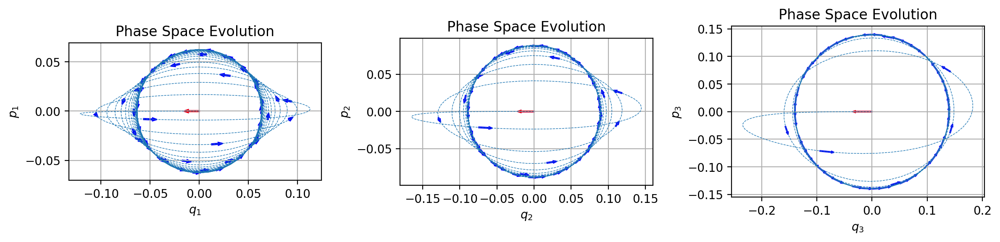

In [18]:
plot_full_evolution_phase_space(X, use_arrows=True)

In [19]:
fig, axs = animate_evolution(X,ts, num_frames=223, animation_time=2)